In [19]:
import py7zr
import pandas as pd
import datasets
import json
import os

In [20]:
pbp = pd.read_csv("data/2015-16_pbp.csv")
pbp.head()

,Unnamed: 0,EVENTMSGACTIONTYPE,EVENTMSGTYPE,EVENTNUM,GAME_ID,HOMEDESCRIPTION,NEUTRALDESCRIPTION,PCTIMESTRING,PERIOD,PERSON1TYPE,...,PLAYER3_ID,PLAYER3_NAME,PLAYER3_TEAM_ABBREVIATION,PLAYER3_TEAM_CITY,PLAYER3_TEAM_ID,PLAYER3_TEAM_NICKNAME,SCORE,SCOREMARGIN,VISITORDESCRIPTION,WCTIMESTRING
0,0,0,12,0,21500758,NaN,NaN,12:00,1,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9:11 PM
1,1,0,10,1,21500758,Jump Ball Gobert vs. Monroe: Tip to Middleton,NaN,12:00,1,4.0,...,203114,Khris Middleton,MIL,Milwaukee,1.610613e+09,Bucks,NaN,NaN,NaN,9:11 PM
2,2,79,2,2,21500758,NaN,NaN,11:45,1,5.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MISS Parker 17' Pullup Jump Shot,9:11 PM
3,3,0,4,3,21500758,Neto REBOUND (Off:0 Def:1),NaN,11:44,1,4.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9:11 PM
4,4,63,1,4,21500758,Neto 4' Fadeaway Jumper (2 PTS),NaN,11:19,1,4.0,...,0,NaN,NaN,NaN,NaN,NaN,0 - 2,2,NaN,9:11 PM


In [21]:
archive_path = r"data\2016.NBA.Raw.SportVU.Game.Logs\01.01.2016.CHA.at.TOR.7z"

with py7zr.SevenZipFile(archive_path, mode="r") as z:
    z.extractall("temp_game")

In [22]:
print(os.listdir("temp_game"))

['0021500492.json']


In [23]:
with open(r"temp_game\0021500492.json", "r", encoding="utf-8") as f:
    game = json.load(f)

print(game.keys())

dict_keys(['gameid', 'gamedate', 'events'])


In [24]:
event = game["events"][0]

print(event.keys())

dict_keys(['eventId', 'visitor', 'home', 'moments'])


In [25]:
moment = event["moments"][0]

print(moment)

[1, 1451695252003, 711.26, 11.99, None, [[-1, -1, 23.4254, 45.12734, 3.64299], [1610612761, 2449, 19.08811, 13.91147, 0.0], [1610612761, 201960, 10.11935, 13.54703, 0.0], [1610612761, 200768, 20.81838, 44.51006, 0.0], [1610612761, 201942, 14.16535, 38.7957, 0.0], [1610612761, 202685, 20.89057, 34.20938, 0.0], [1610612766, 101107, 13.30744, 22.19981, 0.0], [1610612766, 201587, 9.1404, 18.58649, 0.0], [1610612766, 202689, 19.31103, 42.47285, 0.0], [1610612766, 203469, 16.44724, 32.53167, 0.0], [1610612766, 203798, 15.49183, 37.7022, 0.0]]]


In [26]:
print(game.keys())
print(len(game["events"]))
print(game["events"][0].keys())

dict_keys(['gameid', 'gamedate', 'events'])
452
dict_keys(['eventId', 'visitor', 'home', 'moments'])


In [27]:
rows = []

for event in game["events"]:
    event_id = event["eventId"]

    for moment in event["moments"]:
        quarter = moment[0]
        game_clock = moment[2]
        shot_clock = moment[3]

        tracking = moment[5]

        for obj in tracking:

            team_id = obj[0]
            player_id = obj[1]
            x = obj[2]
            y = obj[3]
            z = obj[4]

            rows.append({
                "event_id": event_id,
                "quarter": quarter,
                "game_clock": game_clock,
                "shot_clock": shot_clock,
                "team_id": team_id,
                "player_id": player_id,
                "x": x,
                "y": y,
                "z": z
            })

In [28]:
pd.DataFrame(rows).head(10)

,event_id,quarter,game_clock,shot_clock,team_id,player_id,x,y,z
0,1,1,711.26,11.99,-1,-1,23.42540,45.12734,3.64299
1,1,1,711.26,11.99,1610612761,2449,19.08811,13.91147,0.00000
2,1,1,711.26,11.99,1610612761,201960,10.11935,13.54703,0.00000
3,1,1,711.26,11.99,1610612761,200768,20.81838,44.51006,0.00000
4,1,1,711.26,11.99,1610612761,201942,14.16535,38.79570,0.00000
5,1,1,711.26,11.99,1610612761,202685,20.89057,34.20938,0.00000
6,1,1,711.26,11.99,1610612766,101107,13.30744,22.19981,0.00000
7,1,1,711.26,11.99,1610612766,201587,9.14040,18.58649,0.00000
8,1,1,711.26,11.99,1610612766,202689,19.31103,42.47285,0.00000
9,1,1,711.26,11.99,1610612766,203469,16.44724,32.53167,0.00000


In [29]:
records = []

for event in game["events"]:

    event_row = pbp[
        (pbp.GAME_ID == int(game["gameid"])) &
        (pbp.EVENTNUM == int(event["eventId"]))
    ]

    if len(event_row) != 1:
        continue

    records.append({
        "gameid": game["gameid"],
        "eventid": event["eventId"],
        "event_type": event_row["EVENTMSGTYPE"].iloc[0],
        "home_desc": event_row["HOMEDESCRIPTION"].iloc[0],
        "away_desc": event_row["VISITORDESCRIPTION"].iloc[0],
        "moments": event["moments"]
    })

In [30]:
pd.DataFrame(records)

,gameid,eventid,event_type,home_desc,away_desc,moments
0,0021500492,1,10,Jump Ball Valanciunas vs. Zeller: Tip to Lowry,NaN,"[[1, 1451695252003, 711.26, 11.99, None, [[-1,..."
1,0021500492,2,2,MISS Scola 5' Driving Floating Jump Shot,Zeller BLOCK (1 BLK),"[[1, 1451695250003, 713.26, 13.15, None, [[-1,..."
2,0021500492,3,4,Valanciunas REBOUND (Off:1 Def:0),NaN,"[[1, 1451695250003, 713.26, 13.15, None, [[-1,..."
3,0021500492,4,1,Valanciunas Putback Dunk (2 PTS),NaN,"[[1, 1451695250003, 713.26, 13.15, None, [[-1,..."
4,0021500492,5,1,NaN,Zeller 1' Dunk (2 PTS) (Batum 1 AST),"[[1, 1451695273001, 690.27, 15.38, None, [[-1,..."
...,...,...,...,...,...,...
442,0021500492,543,3,Lowry Free Throw 1 of 2 (17 PTS),NaN,"[[4, 1451702937031, 16.3, None, None, [[-1, -1..."
443,0021500492,545,3,Lowry Free Throw 2 of 2 (18 PTS),NaN,"[[4, 1451702937031, 16.3, None, None, [[-1, -1..."
444,0021500492,548,2,NaN,MISS Hairston 25' 3PT Jump Shot,"[[4, 1451702964030, 9.02, None, None, [[-1, -1..."
445,0021500492,549,4,Ross REBOUND (Off:1 Def:5),NaN,"[[4, 1451702964030, 9.02, None, None, [[-1, -1..."


In [31]:
def draw_court(ax):
    from matplotlib.patches import Circle, Rectangle, Arc
    
    ax.plot([0, 94, 94, 0, 0],
            [0, 0, 50, 50, 0])

    ax.axvline(47, lw=1.1, color='black')
    
    ax.add_patch(Circle((47, 25), 6, fill=False))

    ax.add_patch(Circle((5.25, 25), 0.75, color='blue', fill=False))
    ax.add_patch(Circle((88.75, 25), 0.75, color='red', fill=False))

    ax.plot([4, 4], [22, 28], color='blue')
    ax.plot([90, 90], [22, 28], color='red')

    ax.add_patch(Rectangle((0, 17), 19, 16, fill=False))
    ax.add_patch(Rectangle((75, 17), 19, 16, fill=False))

    
    ax.add_patch(Arc((19, 25), 12, 12, theta1=0, theta2=360))
    ax.add_patch(Arc((75, 25), 12, 12, theta1=0, theta2=360))

    ax.add_patch(
        Arc((5.25, 25), 47.5, 47.5,
            theta1=-68, theta2=68)
    )

    ax.add_patch(
        Arc((88.75, 25), 47.5, 47.5,
            theta1=112, theta2=248)
    )

    ax.plot([0, 14], [3, 3], lw=1.1, color='black')
    ax.plot([0, 14], [47, 47], lw=1.1, color='black')

    ax.plot([80, 94], [3, 3], lw=1.1, color='black')
    ax.plot([80, 94], [47, 47], lw=1.1, color='black')

    ax.set_xlim(0, 94)
    ax.set_ylim(0, 50)
    ax.set_aspect("equal")

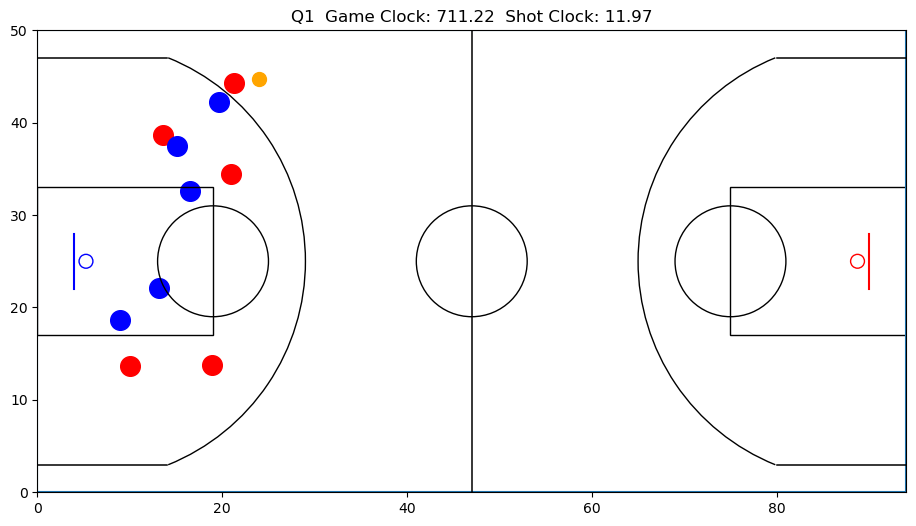

In [32]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

moment = records[0]["moments"][1]
entities = moment[5]

fig, ax = plt.subplots(figsize=(12, 6))

team_colors = {1610612761: "red", 1610612766: "blue"   }

for team_id, player_id, x, y, z in entities:

    if team_id == -1:
        ax.scatter(x, y, s=100, color="orange")
    else:
        ax.scatter(
            x, y,
            color=team_colors[team_id],
            s=200
        )

draw_court(ax)

ax.set_xlim(0, 94)
ax.set_ylim(0, 50)
ax.set_aspect('equal')

ax.set_title(
    f"Q{moment[0]}  Game Clock: {moment[2]:.2f}  Shot Clock: {moment[3]:.2f}"
)

plt.show()

In [33]:
event = records[0]
moments = event["moments"]

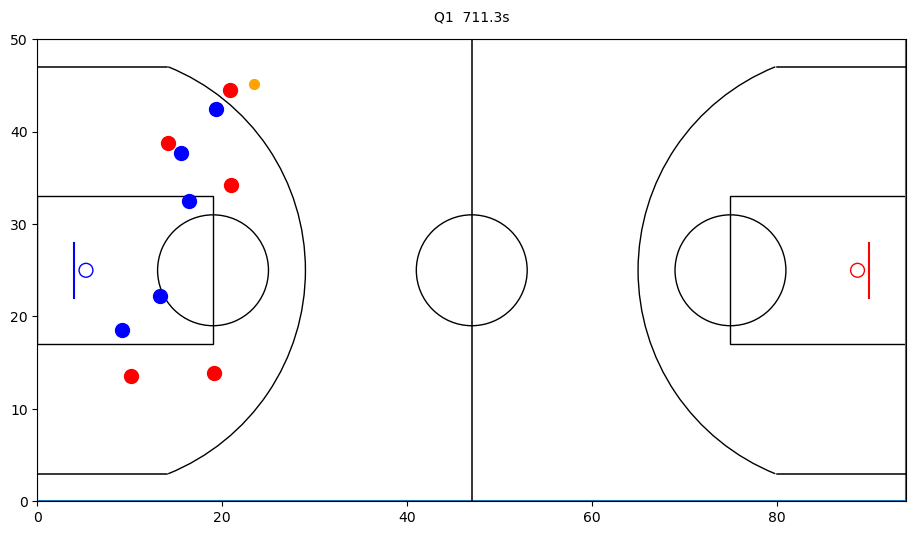

In [34]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(12, 6))

draw_court(ax)

teams = set(
    entity[0]
    for entity in moments[0][5]
    if entity[0] != -1
)

team1, team2 = sorted(teams)

team1_scatter = ax.scatter([], [], label="Team 1", color='red', s=100)
team2_scatter = ax.scatter([], [], label="Team 2", color='blue', s=100)
ball_scatter = ax.scatter([], [], color='orange', s=50)

clock_text = ax.text(
    47, 52, "",
    ha="center"
)

def update(frame):

    moment = moments[frame]
    entities = moment[5]

    team1_x = []
    team1_y = []
    
    team2_x = []
    team2_y = []

    ball_x = None
    ball_y = None

    for team_id, player_id, x, y, z in entities:

        
        if team_id == -1:
            ball_x = x
            ball_y = y
            
        elif team_id == team1:
            team1_x.append(x)
            team1_y.append(y)

        elif team_id == team2:
            team2_x.append(x)
            team2_y.append(y)

    team1_scatter.set_offsets(
        list(zip(team1_x, team1_y))
    )

    team2_scatter.set_offsets(
        list(zip(team2_x, team2_y))
    )

    ball_scatter.set_offsets(
        [[ball_x, ball_y]]
    )

    clock_text.set_text(
        f"Q{moment[0]}  {moment[2]:.1f}s"
    )

    return team1_scatter, team2_scatter, ball_scatter, clock_text

ani = FuncAnimation(
    fig,
    update,
    frames=len(moments),
    interval=40,
    blit=False
)

from IPython.display import HTML

HTML(ani.to_jshtml())

In [ ]:
ani.save(
    "play.gif",
    writer="pillow",
    fps=20
)